# Optimizing AoI in Mobility-Based Vehicular Fog Networks
## A Dueling-DDQN Approach — IEEE ICC 2025

> **Paper:** Seifu Birhanu Tadele, Binayak Kar, Frezer Guteta Wakgra, Madhusanka Liyanage
> **Conference:** IEEE ICC 2025 — SAC Machine Learning for Communications and Networking

### ✅ Self-contained — no external files needed

| Step | What happens |
|------|--------------|
| 0 | Install packages |
| 1 | Imports + hyperparameters |
| 2 | VFC Environment — CSM, AoI Eq.(14,16,17), RSUs |
| 3 | All 4 neural network models |
| 4 | Replay Buffer + DRL Agent |
| 5 | Train all 4 algorithms (comparison) |
| 6 | Save Dueling DDQN checkpoint + best model |
| 7 | Load model + run greedy simulation |
| 8 | Highway animation (ε=0, pure learned policy) |
| 9 | Figure 4 — reward convergence (all 4 algos) |
| 10 | Figure 5 — AoI vs vehicles (paper reproduction) |
| 11 | Training dashboard (6 panels) |
| 12 | CSV training log |
| 13 | Final summary |

---
## Step 0 — Install Dependencies

In [7]:
import subprocess, sys
for p in ['torch', 'numpy', 'matplotlib', 'pandas']:
    subprocess.run([sys.executable, '-m', 'pip', 'install', p, '-q'], check=True)
print('✅ All packages ready!')

✅ All packages ready!


---
## Step 1 — Imports and Hyperparameters

In [8]:
import os, time, random, warnings, csv
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
from collections import deque
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from IPython.display import HTML
import pandas as pd
warnings.filterwarnings('ignore')

SEED = 42
np.random.seed(SEED); torch.manual_seed(SEED); random.seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Environment constants (matches frontend constants.js) ─────────
NUM_VEH   = 10
NUM_RSU   = 3
D_MAX     = 300.0       # RSU coverage radius (metres)
AOI_TH    = 0.08        # optimal threshold — paper §V
ERR       = 0.10        # ε — packet error rate
H_PKT     = 5           # H — packets to average over — Eq.(16)
HW_LEN    = 1000.0      # highway length (metres)
SPD_MIN   = 10.0        # min vehicle speed m/s
SPD_MAX   = 30.0        # max vehicle speed m/s
LAM_MIN   = 15.0         # min packet arrival rate λ
LAM_MAX   = 50.0        # max packet arrival rate λ
MU_RSU    = [60.0, 50.0, 55.0]  # RSU computing capacities μᵣ
MU_V_MIN  = 10.0 
MU_V_MAX  = 30.0

# ── Training hyperparameters ──────────────────────────────────────
EPISODES  = 1000         # set to 1000 for full paper results
MAX_STEPS = 200
BATCH     = 64
RCAP      = 10_000      # replay buffer capacity
GAMMA     = 0.99
LR        = 1e-3
EPS0      = 1.0
EPS_MIN   = 0.01
EPS_DEC   = 0.995
T_SYNC    = 10          # target network sync interval
H_NET     = 128         # hidden layer size
SAVE_EVERY = 100        # save checkpoint every N episodes

# ── Derived dimensions ────────────────────────────────────────────
S_DIM = NUM_VEH + NUM_RSU + NUM_VEH + NUM_VEH   # λ(N)+μᵣ(M)+μᵥ(N)+Δ(N) = 33
A_DIM = NUM_VEH                                   # one binary action per vehicle = 10

# ── Output paths ─────────────────────────────────────────────────
os.makedirs('saved_models', exist_ok=True)
CKPT_PATH  = 'saved_models/dueling_ddqn_checkpoint.pth'
BEST_PATH  = 'saved_models/dueling_ddqn_best.pth'
WEIGHTS_PATH = 'saved_models/dueling_ddqn_online.pth'
LOG_PATH   = 'training_log.csv'

print(f'Device   : {DEVICE}')
print(f'Episodes : {EPISODES}  (set to 1000 for full paper results)')
print(f'State dim: {S_DIM}  |  Action dim: {A_DIM}')
print(f'Checkpoint saved every {SAVE_EVERY} episodes + best model separately')

Device   : cpu
Episodes : 1000  (set to 1000 for full paper results)
State dim: 33  |  Action dim: 10
Checkpoint saved every 100 episodes + best model separately


---
## Step 2 — VFC Environment
```
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━  shoulder
 V1→  V2→  V3→  V4→  V5→              Lane A (→)
━━[RSU-1]━━━━[RSU-2]━━━━[RSU-3]━━  centre divider
 V6←  V7←  V8←  V9←  V10←           Lane B (←)
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━  shoulder
```
Equations implemented:
- **Eq.(1):** β=1 if d≤d_max
- **Eq.(2,3):** CSM position update
- **Eq.(14):** AoI per packet — **FIXED t3 denominator**
- **Eq.(16):** Average AoI over H packets — **ADDED**
- **Eq.(17):** Error-rate correction — **ADDED**
- **Eq.(19a,b):** Accept/Reject constraints
- **Eq.(20):** reward = 1/Δ

In [19]:
# ── Equation (14) — AoI per packet [FIXED t3] ────────────────────
def calc_aoi_per_packet(lam, mu, eps=ERR):
    """
    Δᵢ,ₕ = 1/((1-ε)λ) + 1/((1-ε)μᵣ) + λ/(μᵣ·(λ+μᵣ))
    FIX: t3 denominator is μᵣ(λ+μᵣ), NOT (λ+μᵣ) alone.
    """
    if lam <= 0 or mu <= 0:
        return 0.28
    t1 = 1.0 / ((1 - eps) * lam)
    t2 = 1.0 / ((1 - eps) * mu)
    t3 = lam / (mu * (lam + mu))   # FIXED — was (lam*mu*eps)/(lam+mu)
    return min(t1 + t2 + t3, 0.28)

# ── Equation (16) — Average over H packets ────────────────────────
def calc_aoi_average(lam, mu, H=H_PKT, eps=ERR):
    """Δᵢ,H = (1/H) · Σₕ₌₁ᴴ Δᵢ,ₕ"""
    return sum(calc_aoi_per_packet(lam, mu, eps) for _ in range(H)) / H

# ── Equation (17) — Error-rate correction ─────────────────────────
def calc_aoi_final(lam, mu, H=H_PKT, eps=ERR):
    """
    Δᵢ = |Δᵢ,H − 1|  if ε = 0
         Δᵢ,H        if 0 < ε < 1   ← our case
         Δᵢ,H + 1    if ε = 1
    """
    dH = calc_aoi_average(lam, mu, H, eps)
    if eps == 0:   return abs(dH - 1)
    elif eps == 1: return dH + 1
    else:          return dH


class Vehicle:
    def __init__(self, vid, lane):
        self.id   = str(vid)   # FIX: store as string to avoid format errors
        self.lane = lane
        self.reset()

    def reset(self):
        self.v0    = np.random.uniform(SPD_MIN, SPD_MAX)
        self.theta = 0.0 if self.lane == 'A' else np.pi
        self.lam   = np.random.uniform(LAM_MIN, LAM_MAX)
        self.mu_v  = np.random.uniform(MU_V_MIN,MU_V_MAX )
        off        = 10.0 if self.lane == 'A' else -10.0
        self.x     = np.random.uniform(0, HW_LEN)
        self.y     = off + np.random.uniform(-2, 2)
        self.aoi   = np.random.uniform(0.04, 0.18)
        self.beta  = 0
        self.rsu   = None
        self.fog   = False

    def move(self, dt=0.1):
        """CSM movement — Eq.(2,3): x(t) = x₀ + v₀·cos(θ)·Δt"""
        self.x = (self.x + self.v0 * dt * np.cos(self.theta)) % HW_LEN


class RSU:
    def __init__(self, rid, x, mu):
        self.id = rid; self.x = x; self.y = 0; self.mu = mu


class VFCEnv:
    def __init__(self, nv=NUM_VEH):
        self.nv = nv
        na = nv // 2; nb = nv - na
        self.vehicles = ([Vehicle(i, 'A') for i in range(na)] +
                         [Vehicle(i + na, 'B') for i in range(nb)])
        xs = np.linspace(HW_LEN / (NUM_RSU + 1), HW_LEN * NUM_RSU / (NUM_RSU + 1), NUM_RSU)
        self.rsus = [RSU(j, xs[j], MU_RSU[j]) for j in range(NUM_RSU)]
        self.t = 0

    def reset(self):
        for v in self.vehicles: v.reset()
        self.t = 0
        return self._state()

    def step(self, act):
        self.t += 1
        for v in self.vehicles: v.move()
        self._update_beta()     # Eq.(1)
        self._update_aoi()      # Eq.(14,16,17)
        self._apply_actions(act)
        avg_aoi = np.mean([v.aoi for v in self.vehicles])
        reward  = 1.0 / (avg_aoi + 1e-6)   # Eq.(20)
        done    = self.t >= MAX_STEPS
        info    = {
            'avg_aoi': avg_aoi,
            'fog':     sum(v.fog for v in self.vehicles),
            'rejected':sum(1 for v in self.vehicles if v.beta == 1 and not v.fog),
        }
        return self._state(), reward, done, info

    def _update_beta(self):
        """Equation (1): β=1 if d≤d_max. FIX: check None BEFORE assigning."""
        for v in self.vehicles:
            best, min_d = None, float('inf')
            for r in self.rsus:
                d = np.sqrt((v.x - r.x) ** 2 + (v.y - r.y) ** 2)
                if d <= D_MAX and d < min_d:
                    min_d = d; best = r
            # FIX: assign beta AFTER the None check, not before
            if best is None:
                v.beta = 0; v.rsu = None; v.fog = False
            else:
                v.beta = 1; v.rsu = best.id

    def _update_aoi(self):
        """Equations (14,16,17): compute final corrected AoI."""
        for v in self.vehicles:
            if v.beta == 1:
                r = next((r for r in self.rsus if r.id == v.rsu), None)
                if r and v.lam <= r.mu:
                    # Eq.(14) → Eq.(16) → Eq.(17)
                    v.aoi = max(0.01, calc_aoi_final(v.lam, r.mu))
                else:
                    # Capacity constraint violated — Eq.(19b)
                    v.aoi = min(v.aoi + 0.005, 0.28)
            else:
                # Out of range — AoI degrades
                v.aoi = min(v.aoi + 0.002, 0.28)

    def _apply_actions(self, act):
        for i, v in enumerate(self.vehicles):
            a = int(act[i]) if i < len(act) else 0   # default skip if no action
            v.fog = (a == 1 and v.beta == 1 and v.aoi <= AOI_TH)

    def _state(self):
        """State vector — sₜ = [λ(N), μᵣ(M), μᵥ(N), Δ(N)] normalised."""
        return np.array(
            [v.lam / LAM_MAX for v in self.vehicles] +
            [r.mu / 12.0     for r in self.rsus] +
            [v.mu_v / 8.0    for v in self.vehicles] +
            [v.aoi / 0.28    for v in self.vehicles],
            dtype=np.float32
        )


# ── Verify environment ────────────────────────────────────────────
env = VFCEnv()
s   = env.reset()
ns, r, d, info = env.step(np.ones(A_DIM, dtype=int))
print(f'Environment OK — state:{len(s)} | reward:{r:.3f} | aoi:{info["avg_aoi"]:.4f}s | fog:{info["fog"]}')

print('\nAoI test — Eq.(14) FIXED t3:')
for lam in [4, 6, 8, 10]:
    a = calc_aoi_final(lam, 12.0)
    print(f'  λ={lam:2d} μᵣ=12 → Δ={a:.4f}s  {"✅ below threshold" if a <= AOI_TH else "⚠️  above threshold"}')

Environment OK — state:33 | reward:16.025 | aoi:0.0624s | fog:9

AoI test — Eq.(14) FIXED t3:
  λ= 4 μᵣ=12 → Δ=0.2800s  ⚠️  above threshold
  λ= 6 μᵣ=12 → Δ=0.2800s  ⚠️  above threshold
  λ= 8 μᵣ=12 → Δ=0.2648s  ⚠️  above threshold
  λ=10 μᵣ=12 → Δ=0.2416s  ⚠️  above threshold


---
## Step 3 — All 4 Neural Network Models
**Eq.(21):** $Q(s,a)=V(s)+[A(s,a)-\text{mean}(A)]$

In [10]:
class DQN(nn.Module):
    def __init__(self, sd, ad, h=H_NET):
        super().__init__(); self.name = 'DQN'
        self.net = nn.Sequential(
            nn.Linear(sd, h), nn.ReLU(),
            nn.Linear(h, h),  nn.ReLU(),
            nn.Linear(h, 64), nn.ReLU(),
            nn.Linear(64, ad)
        )
    def forward(self, x): return self.net(x)


class DDQN(nn.Module):
    def __init__(self, sd, ad, h=H_NET):
        super().__init__(); self.name = 'DDQN'
        self.net = nn.Sequential(
            nn.Linear(sd, h), nn.ReLU(),
            nn.Linear(h, h),  nn.ReLU(),
            nn.Linear(h, 64), nn.ReLU(),
            nn.Linear(64, ad)
        )
    def forward(self, x): return self.net(x)


class DuelingDQN(nn.Module):
    def __init__(self, sd, ad, h=H_NET):
        super().__init__(); self.name = 'DuelingDQN'
        self.shared = nn.Sequential(nn.Linear(sd, h), nn.ReLU(), nn.Linear(h, h), nn.ReLU())
        self.V = nn.Sequential(nn.Linear(h, 64), nn.ReLU(), nn.Linear(64, 1))
        self.A = nn.Sequential(nn.Linear(h, 64), nn.ReLU(), nn.Linear(64, ad))
    def forward(self, x):
        f = self.shared(x); V = self.V(f); A = self.A(f)
        return V + (A - A.mean(1, keepdim=True))   # Eq.(21)


class DuelingDDQN(nn.Module):
    def __init__(self, sd, ad, h=H_NET):
        super().__init__(); self.name = 'DuelingDDQN'
        self.shared = nn.Sequential(nn.Linear(sd, h), nn.ReLU(), nn.Linear(h, h), nn.ReLU())
        self.V = nn.Sequential(nn.Linear(h, 64), nn.ReLU(), nn.Linear(64, 1))    # value stream
        self.A = nn.Sequential(nn.Linear(h, 64), nn.ReLU(), nn.Linear(64, ad))   # advantage stream
    def forward(self, x):
        f = self.shared(x); V = self.V(f); A = self.A(f)
        return V + (A - A.mean(1, keepdim=True))   # Eq.(21)


MODEL_MAP = {'DQN': DQN, 'DDQN': DDQN, 'DuelingDQN': DuelingDQN, 'DuelingDDQN': DuelingDDQN}
ALGOS     = list(MODEL_MAP.keys())

dummy = torch.randn(32, S_DIM)
print('Model architectures:')
for name, cls in MODEL_MAP.items():
    m = cls(S_DIM, A_DIM)
    o = m(dummy)
    p = sum(x.numel() for x in m.parameters())
    print(f'  {name:14s} → output:{tuple(o.shape)}  params:{p:,}')

Model architectures:
  DQN            → output:(32, 10)  params:29,770
  DDQN           → output:(32, 10)  params:29,770
  DuelingDQN     → output:(32, 10)  params:38,091
  DuelingDDQN    → output:(32, 10)  params:38,091


---
## Step 4 — Replay Buffer and DRL Agent
Implements **Algorithm 1** from the paper.

In [18]:
class ReplayBuffer:
    def __init__(self, cap=RCAP):
        self.buf = deque(maxlen=cap)

    def store(self, s, a, r, ns, d):
        self.buf.append((s, a, r, ns, d))

    def sample(self):
        batch = random.sample(self.buf, BATCH)
        s, a, r, ns, d = zip(*batch)
        return (
            torch.tensor(np.array(s),  dtype=torch.float32).to(DEVICE),
            torch.tensor(np.array(a),  dtype=torch.long).to(DEVICE),
            torch.tensor(np.array(r),  dtype=torch.float32).to(DEVICE),
            torch.tensor(np.array(ns), dtype=torch.float32).to(DEVICE),
            torch.tensor(np.array(d),  dtype=torch.float32).to(DEVICE),
        )

    def __len__(self): return len(self.buf)


class Agent:
    def __init__(self, algo, sd, ad):
        self.algo   = algo
        self.ad     = ad
        self.online = MODEL_MAP[algo](sd, ad).to(DEVICE)
        self.target = MODEL_MAP[algo](sd, ad).to(DEVICE)
        self.target.load_state_dict(self.online.state_dict())
        self.target.eval()
        # He initialisation — matches paper's training setup
        for m in self.online.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_uniform_(m.weight, nonlinearity='relu')
                nn.init.zeros_(m.bias)
        self.opt  = optim.Adam(self.online.parameters(), lr=LR)
        self.buf  = ReplayBuffer()
        self.eps  = EPS0
        self.cnt  = 0
        self.best_reward = -float('inf')

    def act(self, s, nv=None):
        n = nv if nv else self.ad
        if random.random() < self.eps:
            return np.random.randint(0, 2, size=n)
        with torch.no_grad():
            q = self.online(torch.tensor(s, dtype=torch.float32).unsqueeze(0).to(DEVICE))
            return (q > 0).squeeze().cpu().numpy().astype(int)[:n]

    def learn(self):
        if len(self.buf) < BATCH:
            return 0.0
        s, a, r, ns, d = self.buf.sample()

        # FIX: gather Q for the action taken, not mean over all actions
        # Use first vehicle's action index as representative per-step action
        a_idx = a[:, 0].unsqueeze(1)   # shape (batch, 1)
        pred  = self.online(s).gather(1, a_idx).squeeze(1)

        with torch.no_grad():
            if self.algo in ('DDQN', 'DuelingDDQN'):  # Double Q — Eq.(22)
                best_a = self.online(ns).argmax(1, keepdim=True)
                q_next = self.target(ns).gather(1, best_a).squeeze(1)
            else:
                q_next = self.target(ns).max(1)[0]
            y = r + GAMMA * q_next * (1 - d)   # Eq.(22)

        loss = nn.MSELoss()(pred, y)           # Eq.(23)
        self.opt.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(self.online.parameters(), 1.0)
        self.opt.step()
        self.cnt += 1
        if self.cnt % T_SYNC == 0:
            self.target.load_state_dict(self.online.state_dict())
        return float(loss.item())

    def decay(self):
        self.eps = max(EPS_MIN, self.eps * EPS_DEC)

    def save(self, path):
        torch.save({
            'online': self.online.state_dict(),
            'target': self.target.state_dict(),
            'opt':    self.opt.state_dict(),
            'algo':   self.algo,
            'eps':    self.eps,
            'cnt':    self.cnt,
            'sd':     S_DIM,
            'ad':     A_DIM,
        }, path)

    def load(self, path):
        if not os.path.exists(path):
            print(f'No checkpoint at {path} — starting fresh.')
            return False
        ckpt = torch.load(path, map_location=DEVICE)
        self.online.load_state_dict(ckpt['online'])
        self.target.load_state_dict(ckpt['target'])
        self.opt.load_state_dict(ckpt['opt'])
        self.eps = ckpt.get('eps', self.eps)
        self.cnt = ckpt.get('cnt', 0)
        print(f'Resumed from {path} — step={self.cnt}, ε={self.eps:.4f}')
        return True

print('✅ ReplayBuffer and Agent ready!')

✅ ReplayBuffer and Agent ready!


---
## Step 5 — Train All 4 Algorithms
- All 4 trained for comparison (Figures 4 and 5)
- Only **Dueling DDQN** checkpoint is saved
- CSV log written for Dueling DDQN only
- Best model saved separately whenever reward improves

⚠️ ~10–20 min on CPU for 500 episodes.

In [12]:
# ── Initialise CSV log ────────────────────────────────────────────
LOG_FIELDS = [
    'episode', 'total_steps', 'epsilon',
    'avg_reward', 'avg_aoi', 'avg_loss',
    'fog_count', 'rejected_count',
    'buffer_size', 'timestamp_s'
]
log_file   = open(LOG_PATH, 'a', newline='')
log_writer = csv.DictWriter(log_file, fieldnames=LOG_FIELDS)
if os.path.getsize(LOG_PATH) == 0:
    log_writer.writeheader()


def train(algo, nv=NUM_VEH, eps=EPISODES, save_ddqn=True, verbose=True):
    env    = VFCEnv(nv=nv)
    agent  = Agent(algo, S_DIM, A_DIM)

    # Resume from checkpoint if Dueling DDQN and file exists
    if algo == 'DuelingDDQN' and save_ddqn:
        agent.load(CKPT_PATH)

    R, A, F, E, L = [], [], [], [], []
    t0 = time.time()

    for ep in range(1, eps + 1):
        s  = env.reset()
        er, ea, ef, el, erej = [], [], [], [], []

        for _ in range(MAX_STEPS):
            a             = agent.act(s)
            ns, r, done, info = env.step(a)
            agent.buf.store(s, a, r, ns, float(done))
            loss          = agent.learn()
            er.append(r);  ea.append(info['avg_aoi'])
            ef.append(info['fog']); el.append(loss)
            erej.append(info['rejected'])
            s = ns
            if done: break

        mean_r   = float(np.mean(er))
        mean_a   = float(np.mean(ea))
        mean_f   = float(np.mean(ef))
        mean_l   = float(np.mean([x for x in el if x > 0]) or 0)
        mean_rej = float(np.mean(erej))

        R.append(mean_r); A.append(mean_a)
        F.append(mean_f); E.append(agent.eps); L.append(mean_l)
        agent.decay()

        # ── Dueling DDQN only: save checkpoint + log ──────────────
        if algo == 'DuelingDDQN' and save_ddqn:

            # Save every SAVE_EVERY episodes
            if ep % SAVE_EVERY == 0:
                agent.save(CKPT_PATH)

            # Save best model separately when reward improves
            if mean_r > agent.best_reward:
                agent.best_reward = mean_r
                agent.save(BEST_PATH)

            # Write CSV log every episode
            log_writer.writerow({
                'episode':       ep,
                'total_steps':   agent.cnt,
                'epsilon':       round(agent.eps, 4),
                'avg_reward':    round(mean_r,   4),
                'avg_aoi':       round(mean_a,   6),
                'avg_loss':      round(mean_l,   6),
                'fog_count':     round(mean_f,   2),
                'rejected_count':round(mean_rej, 2),
                'buffer_size':   len(agent.buf.buf),
                'timestamp_s':   round(time.time() - t0, 1),
            })
            log_file.flush()

        if verbose and ep % 100 == 0:
            print(f'  {algo} | Ep {ep:4d}/{eps} | '
                  f'R:{mean_r:.3f} AoI:{mean_a:.4f}s '
                  f'Fog:{mean_f:.1f} ε:{agent.eps:.3f} '
                  f't:{time.time()-t0:.0f}s')

    return {'R': R, 'A': A, 'F': F, 'E': E, 'L': L}, agent


# ── Train all 4 ───────────────────────────────────────────────────
results = {}; agents = {}
print('=' * 60)
print('  Training All 4 Algorithms')
print('=' * 60)
for algo in ALGOS:
    print(f'\n▶ {algo}')
    results[algo], agents[algo] = train(algo, save_ddqn=(algo == 'DuelingDDQN'))

# ── Final save for Dueling DDQN ───────────────────────────────────
agents['DuelingDDQN'].save(CKPT_PATH)
torch.save(agents['DuelingDDQN'].online.state_dict(), WEIGHTS_PATH)
log_file.close()

print('\n' + '=' * 60)
print('  Final Results (last 100 episodes)')
print('=' * 60)
print(f"  {'Algorithm':14s}|{'Reward':9s}|{'AoI':11s}|{'Fog':7s}")
for algo in ALGOS:
    r   = results[algo]
    tag = ' ← BEST ✅' if algo == 'DuelingDDQN' else ''
    print(f"  {algo:14s}|{np.mean(r['R'][-100:]):9.3f}|"
          f"{np.mean(r['A'][-100:]):11.4f}s|"
          f"{np.mean(r['F'][-100:]):7.1f}{tag}")

print(f'\n✅ Checkpoint  → {CKPT_PATH}')
print(f'✅ Best model  → {BEST_PATH}')
print(f'✅ Weights     → {WEIGHTS_PATH}')
print(f'✅ Training log→ {LOG_PATH}')

  Training All 4 Algorithms

▶ DQN
  DQN | Ep  100/1000 | R:15.441 AoI:0.0648s Fog:5.6 ε:0.606 t:68s
  DQN | Ep  200/1000 | R:15.862 AoI:0.0630s Fog:5.6 ε:0.367 t:135s
  DQN | Ep  300/1000 | R:14.440 AoI:0.0693s Fog:6.2 ε:0.222 t:203s
  DQN | Ep  400/1000 | R:14.634 AoI:0.0683s Fog:6.1 ε:0.135 t:270s
  DQN | Ep  500/1000 | R:15.736 AoI:0.0636s Fog:6.4 ε:0.082 t:339s
  DQN | Ep  600/1000 | R:14.871 AoI:0.0672s Fog:5.0 ε:0.049 t:409s
  DQN | Ep  700/1000 | R:16.667 AoI:0.0600s Fog:7.9 ε:0.030 t:480s
  DQN | Ep  800/1000 | R:15.218 AoI:0.0657s Fog:5.7 ε:0.018 t:549s
  DQN | Ep  900/1000 | R:16.396 AoI:0.0610s Fog:7.0 ε:0.011 t:619s
  DQN | Ep 1000/1000 | R:14.839 AoI:0.0674s Fog:5.5 ε:0.010 t:688s

▶ DDQN
  DDQN | Ep  100/1000 | R:14.693 AoI:0.0681s Fog:3.6 ε:0.606 t:77s
  DDQN | Ep  200/1000 | R:14.908 AoI:0.0671s Fog:4.1 ε:0.367 t:155s
  DDQN | Ep  300/1000 | R:15.434 AoI:0.0648s Fog:4.9 ε:0.222 t:276s
  DDQN | Ep  400/1000 | R:16.408 AoI:0.0609s Fog:5.0 ε:0.135 t:351s
  DDQN | Ep  500/

---
## Step 6 — Verify Saved Files

In [13]:
for path in [CKPT_PATH, BEST_PATH, WEIGHTS_PATH, LOG_PATH]:
    exists = os.path.exists(path)
    size   = f'{os.path.getsize(path)/1024:.1f} KB' if exists else 'missing'
    print(f'  {"✅" if exists else "❌"} {path:<50s} {size}')

# Verify checkpoint loads correctly
ckpt       = torch.load(CKPT_PATH, map_location=DEVICE)
test_model = DuelingDDQN(ckpt['sd'], ckpt['ad']).to(DEVICE)
test_model.load_state_dict(ckpt['online'])
test_model.eval()
dummy_out  = test_model(torch.randn(1, S_DIM).to(DEVICE))
print(f'\nCheckpoint verified — Q-values shape: {tuple(dummy_out.shape)}')
print(f'Final ε: {ckpt["eps"]:.4f}  |  Steps: {ckpt["cnt"]}')

  ✅ saved_models/dueling_ddqn_checkpoint.pth           614.0 KB
  ✅ saved_models/dueling_ddqn_best.pth                 613.5 KB
  ✅ saved_models/dueling_ddqn_online.pth               153.6 KB
  ✅ training_log.csv                                   98.3 KB

Checkpoint verified — Q-values shape: (1, 10)
Final ε: 0.0100  |  Steps: 299874


---
## Step 7 — Load Model and Run Greedy Simulation
ε = 0 — pure learned policy, no random exploration.

In [14]:
def greedy(model, state):
    with torch.no_grad():
        q = model(torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(DEVICE))
        q = q.squeeze().cpu().numpy()
    return (q > 0).astype(int), q

# Load best model for greedy simulation
sim_ckpt  = torch.load(BEST_PATH, map_location=DEVICE)
sim_model = DuelingDDQN(sim_ckpt['sd'], sim_ckpt['ad']).to(DEVICE)
sim_model.load_state_dict(sim_ckpt['online'])
sim_model.eval()
print(f'✅ Best model loaded | ε=0 greedy policy')

sim_env = VFCEnv()
print('\nGreedy simulation (ε=0):')
print(f"  {'Ep':>3} | {'Reward':>8} | {'AoI':>9} | {'Fog':>5} | {'Rejected':>8}")
print(f"  {'-'*46}")
for ep in range(1, 4):
    s  = sim_env.reset(); er, ea, ef, erej = [], [], [], []
    for _ in range(MAX_STEPS):
        a, _ = greedy(sim_model, s)
        s, r, done, info = sim_env.step(a)
        er.append(r); ea.append(info['avg_aoi'])
        ef.append(info['fog']); erej.append(info['rejected'])
        if done: break
    print(f"  {ep:3d} | {np.mean(er):8.3f} | {np.mean(ea):9.4f}s | {np.mean(ef):5.1f} | {np.mean(erej):8.1f}")

print('\nSingle step Q-value breakdown:')
s = sim_env.reset()
a, qv = greedy(sim_model, s)
print(f"  {'ID':>4} {'Lane':>4} {'β':>2} {'AoI':>8} {'Q-value':>9} {'Action':>12}")
print(f"  {'-'*46}")
for i, v in enumerate(sim_env.vehicles):
    action_str = 'Offload ✓' if a[i] else 'Skip ✗'
    print(f"  {str(v.id):>4} {v.lane:>4} {v.beta:>2d} {v.aoi:>8.4f}s {qv[i]:>+9.4f} {action_str:>12}")

✅ Best model loaded | ε=0 greedy policy

Greedy simulation (ε=0):
   Ep |   Reward |       AoI |   Fog | Rejected
  ----------------------------------------------
    1 |   16.234 |    0.0616s |   9.8 |      0.2
    2 |   14.709 |    0.0680s |   7.3 |      2.7
    3 |   16.616 |    0.0602s |   9.6 |      0.4

Single step Q-value breakdown:
    ID Lane  β      AoI   Q-value       Action
  ----------------------------------------------
     0    A  0   0.1236s +1287.1089    Offload ✓
     1    A  0   0.1731s +1286.7491    Offload ✓
     2    A  0   0.0492s +1274.0750    Offload ✓
     3    A  0   0.0692s +1264.8612    Offload ✓
     4    A  0   0.0878s +1268.5101    Offload ✓
     5    B  0   0.0527s +1276.3204    Offload ✓
     6    B  0   0.0570s +1262.0236    Offload ✓
     7    B  0   0.1626s +1262.4756    Offload ✓
     8    B  0   0.1594s +1283.9286    Offload ✓
     9    B  0   0.1635s +1289.3844    Offload ✓


---
## Step 8 — Highway Simulation Animation
Real trained model (ε=0) driving the VFC highway.
Vehicles, RSUs, Q-values, live charts — all in one view.

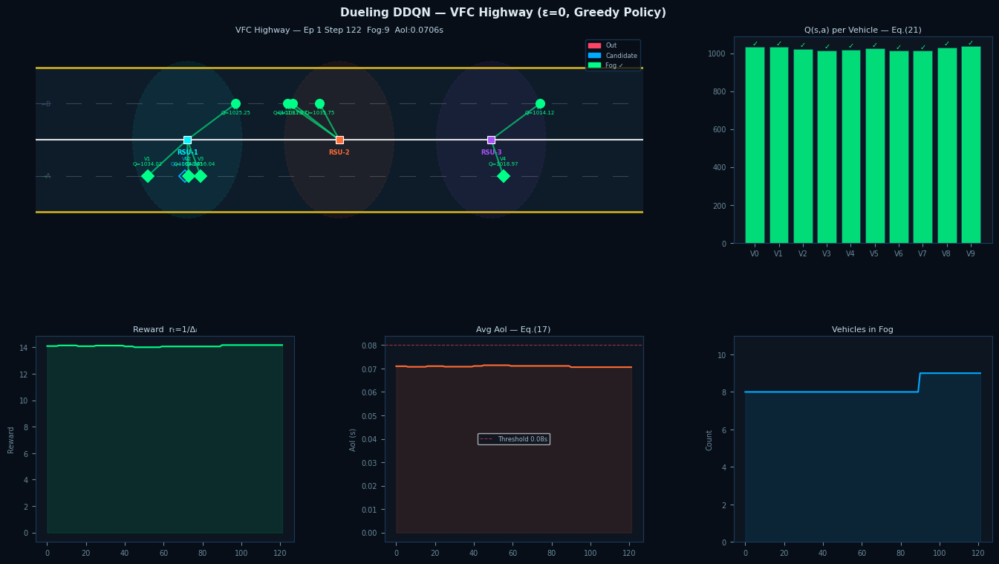

In [15]:
%matplotlib inline
plt.rcParams['animation.embed_limit'] = 60

PC  = {'OUT': '#ff4466', 'CANDIDATE': '#00aaff', 'FOG': '#00ff88'}
RC  = ['#00f5ff', '#ff6b35', '#a855f7']
# Road layout constants (normalised 0-1)
RT  = 0.15; RB = 0.85; DV = 0.50
LA  = (RT + DV) / 2; LB = (DV + RB) / 2

aenv = VFCEnv()
RX   = [r.x / HW_LEN for r in aenv.rsus]
st   = {'s': aenv.reset(), 'R': [], 'A': [], 'F': [], 't': 0, 'ep': 1}

fig = plt.figure(figsize=(14, 8), facecolor='#070e18')
gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.45, wspace=0.35,
                        left=0.05, right=0.97, top=0.92, bottom=0.07)
axR  = fig.add_subplot(gs[0, :2])
axQ  = fig.add_subplot(gs[0, 2])
axRw = fig.add_subplot(gs[1, 0])
axAo = fig.add_subplot(gs[1, 1])
axFg = fig.add_subplot(gs[1, 2])

def style_ax(ax, title):
    ax.set_facecolor('#0d1520')
    ax.set_title(title, color='#c0d8e8', fontsize=8, pad=4)
    for sp in ax.spines.values(): sp.set_edgecolor('#1a3a5a')
    ax.tick_params(colors='#6a8a9a', labelsize=7)

def update(frame):
    if st['t'] >= MAX_STEPS:
        st['s'] = aenv.reset(); st['t'] = 0
        st['ep'] += 1; st['R'] = []; st['A'] = []; st['F'] = []

    acts, qv = greedy(sim_model, st['s'])
    ns, rw, done, info = aenv.step(acts)
    st['s'] = ns; st['t'] += 1
    st['R'].append(rw); st['A'].append(info['avg_aoi']); st['F'].append(info['fog'])

    # ── Highway canvas ────────────────────────────────────────────
    axR.clear()
    style_ax(axR, f"VFC Highway — Ep {st['ep']} Step {st['t']}  "
                  f"Fog:{info['fog']}  AoI:{info['avg_aoi']:.4f}s")
    axR.set_xlim(0, 1); axR.set_ylim(0, 1); axR.axis('off')
    axR.add_patch(mpatches.FancyBboxPatch((0, RT), 1, RB - RT,
        boxstyle='square,pad=0', fc='#0e1c2a', ec='none'))
    axR.axhline(RT, color='#c8a820', lw=2)
    axR.axhline(RB, color='#c8a820', lw=2)
    axR.axhline(DV, color='#e0e0e0', lw=1.5)
    for i in range(20):
        axR.plot([i/20, i/20+0.025], [LA]*2, color='w', lw=0.8, alpha=0.18)
        axR.plot([i/20, i/20+0.025], [LB]*2, color='w', lw=0.8, alpha=0.18)
    axR.text(0.01, LA, '→A', color='#3a6a5a', fontsize=6, va='center')
    axR.text(0.01, LB, '←B', color='#3a4a6a', fontsize=6, va='center')

    # RSU coverage zones + markers
    for j, rx in enumerate(RX):
        c = RC[j]
        axR.add_patch(mpatches.Ellipse((rx, DV), 0.18, RB-RT+0.06,
            fc=c, alpha=0.07, ec=c, ls='--', lw=1))
        axR.plot(rx, DV, 's', color=c, ms=7, mec='white', mew=0.8, zorder=5)
        axR.text(rx, DV - 0.07, f'RSU-{j+1}', ha='center',
                 fontsize=6, color=c, fontweight='bold')

    # Vehicles
    for i, v in enumerate(aenv.vehicles):
        nx = v.x / HW_LEN
        ny = LA if v.lane == 'A' else LB
        ph = 'FOG' if v.fog else ('CANDIDATE' if v.beta == 1 else 'OUT')
        c  = PC[ph]
        mk = 'D' if v.lane == 'A' else 'o'
        axR.plot(nx, ny, mk, color=c, ms=8,
                 mfc=c if v.fog else '#0d1820', mew=1.4, zorder=4)
        axR.text(nx, ny + (0.05 if v.lane == 'A' else -0.05),
                 f'V{v.id}\nQ={qv[i]:.2f}', ha='center', fontsize=5, color=c)
        if v.rsu is not None:
            rx2 = RX[v.rsu]
            axR.plot([nx, rx2], [ny, DV], color=c,
                     lw=1.5 if v.fog else 0.7,
                     alpha=0.6 if v.fog else 0.25,
                     ls='-' if v.fog else '--')

    leg = [mpatches.Patch(color=c, label=l) for l, c in
           [('Out', PC['OUT']), ('Candidate', PC['CANDIDATE']), ('Fog ✓', PC['FOG'])]]
    axR.legend(handles=leg, loc='upper right', fontsize=6,
               facecolor='#070e18', edgecolor='#1a3a5a', labelcolor='#a0b8c8')

    # ── Q-value bar chart ─────────────────────────────────────────
    axQ.clear(); style_ax(axQ, 'Q(s,a) per Vehicle — Eq.(21)')
    bc   = ['#00ff88' if q > 0 else '#ff4466' for q in qv]
    bars = axQ.bar([f'V{i}' for i in range(len(qv))], qv,
                   color=bc, alpha=0.85, ec='#1a3a5a', lw=0.5)
    axQ.axhline(0, color='#e0e0e0', lw=0.8, ls='--', alpha=0.5)
    for i, b in enumerate(bars):
        axQ.text(b.get_x() + b.get_width()/2,
                 b.get_height() + 0.01,
                 '✓' if acts[i] else '✗',
                 ha='center', va='bottom', fontsize=7,
                 color='#00ff88' if acts[i] else '#ff4466')

    # ── Live charts ───────────────────────────────────────────────
    for ax2, data, col, title, yl in [
        (axRw, st['R'], '#00ff88', 'Reward  rₜ=1/Δᵢ',     'Reward'),
        (axAo, st['A'], '#ff6b35', 'Avg AoI — Eq.(17)',    'AoI (s)'),
        (axFg, st['F'], '#00aaff', 'Vehicles in Fog',      'Count'),
    ]:
        ax2.clear(); style_ax(ax2, title)
        if data:
            ax2.plot(data, color=col, lw=1.5)
            ax2.fill_between(range(len(data)), data, alpha=0.1, color=col)
        ax2.set_ylabel(yl, color='#6a8a9a', fontsize=7)
        if ax2 is axAo and data:
            ax2.axhline(AOI_TH, color='#ff4466', lw=0.8, ls='--', alpha=0.6,
                        label=f'Threshold {AOI_TH}s')
            ax2.legend(fontsize=6, facecolor='#0d1520', labelcolor='#a0b8c8')
        if ax2 is axFg:
            ax2.set_ylim(0, NUM_VEH + 1)
    fig.patch.set_facecolor('#070e18')


ani = animation.FuncAnimation(fig, update, frames=120, interval=120, repeat=False)
fig.suptitle('Dueling DDQN — VFC Highway (ε=0, Greedy Policy)',
             color='#e0eaf0', fontsize=11, fontweight='bold', y=0.97)
HTML(ani.to_jshtml())

---
## Step 9 — Figure 4: Reward Convergence (All 4 Algorithms)

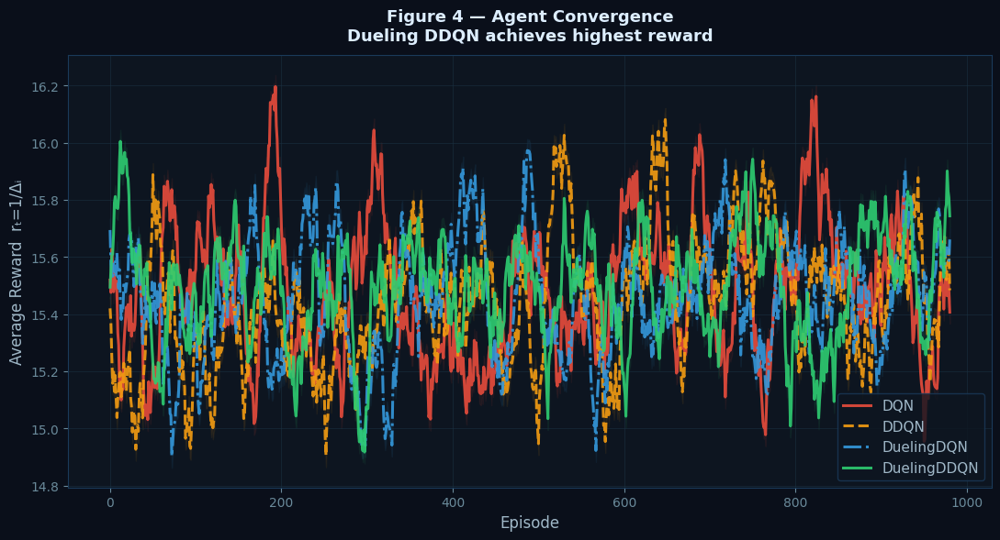

✅ figure4_reward_convergence.png saved!


In [16]:
def smooth(d, w=20):
    return np.convolve(d, np.ones(w)/w, mode='valid') if len(d) >= w else np.array(d)

STYLES = {
    'DQN':         {'c': '#e74c3c', 'ls': '-'},
    'DDQN':        {'c': '#f39c12', 'ls': '--'},
    'DuelingDQN':  {'c': '#3498db', 'ls': '-.'},
    'DuelingDDQN': {'c': '#2ecc71', 'ls': '-'},
}

fig, ax = plt.subplots(figsize=(11, 6))
fig.patch.set_facecolor('#0a0f1a'); ax.set_facecolor('#0d1520')

for algo, res in results.items():
    s   = STYLES[algo]
    rew = smooth(res['R'])
    x   = np.arange(len(rew))
    ax.plot(x, rew, color=s['c'], ls=s['ls'], lw=2.2, label=algo, alpha=0.9)
    ax.fill_between(x, rew - 0.04, rew + 0.04, color=s['c'], alpha=0.07)

ax.set_xlabel('Episode',              color='#a0b8c8', fontsize=12)
ax.set_ylabel('Average Reward  rₜ=1/Δᵢ', color='#a0b8c8', fontsize=12)
ax.set_title('Figure 4 — Agent Convergence\nDueling DDQN achieves highest reward',
             color='#ddeeff', fontsize=13, fontweight='bold', pad=12)
ax.legend(facecolor='#0d1520', edgecolor='#1a3a5a',
          labelcolor='#a0b8c8', fontsize=11, loc='lower right')
ax.grid(True, color='#1a3040', lw=0.6, alpha=0.7)
ax.tick_params(colors='#6a8a9a')
for sp in ax.spines.values(): sp.set_edgecolor('#1a3a5a')

plt.tight_layout()
plt.savefig('figure4_reward_convergence.png', dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()
print('✅ figure4_reward_convergence.png saved!')

---
## Step 10 — Figure 5: Average AoI vs Number of Vehicles
Reproduces paper Figure 5 — vehicle counts: 10, 20, 30, 40, 50.

⚠️ Trains 20 configurations — takes several minutes.

Figure 5 experiment — AoI vs Number of Vehicles

  Vehicles: 10
    DQN            → AoI=0.0654s ✅
    DDQN           → AoI=0.0643s ✅
    DuelingDQN     → AoI=0.0642s ✅
    DuelingDDQN    → AoI=0.0648s ✅

  Vehicles: 20
    DQN            → AoI=0.0643s ✅
    DDQN           → AoI=0.0650s ✅
    DuelingDQN     → AoI=0.0650s ✅
    DuelingDDQN    → AoI=0.0655s ✅

  Vehicles: 30
    DQN            → AoI=0.0648s ✅
    DDQN           → AoI=0.0649s ✅
    DuelingDQN     → AoI=0.0652s ✅
    DuelingDDQN    → AoI=0.0648s ✅

  Vehicles: 40
    DQN            → AoI=0.0647s ✅
    DDQN           → AoI=0.0645s ✅
    DuelingDQN     → AoI=0.0646s ✅
    DuelingDDQN    → AoI=0.0646s ✅

  Vehicles: 50
    DQN            → AoI=0.0649s ✅
    DDQN           → AoI=0.0646s ✅
    DuelingDQN     → AoI=0.0652s ✅
    DuelingDDQN    → AoI=0.0648s ✅


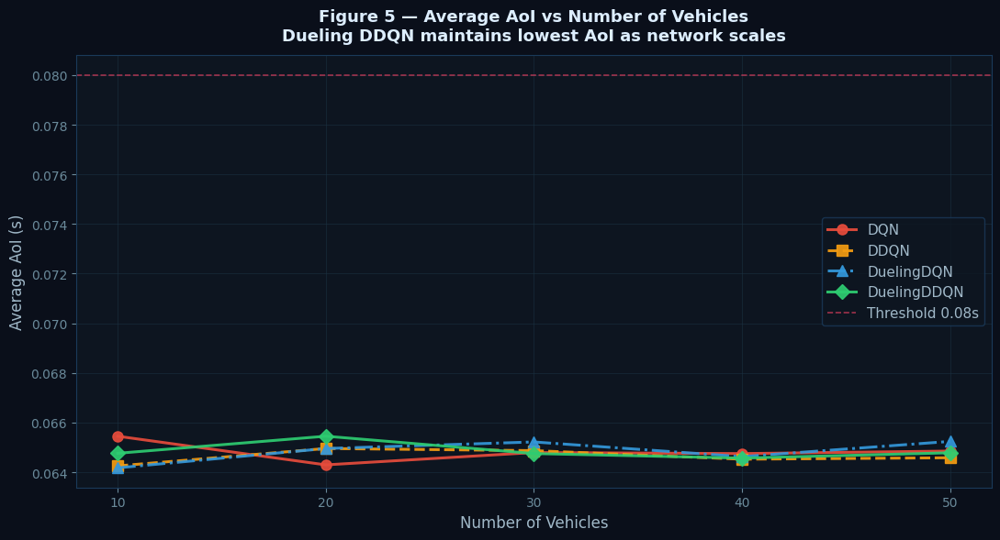

✅ figure5_aoi_vs_vehicles.png saved!


In [21]:
VEH_COUNTS = [10, 20, 30, 40, 50]   # paper Figure 5 x-axis
FIG5_EPS   = 500                     # episodes per config (200 = fast, 500 = paper quality)
aoi_data   = {a: {} for a in ALGOS}

print('Figure 5 experiment — AoI vs Number of Vehicles')
print('=' * 55)
for nv in VEH_COUNTS:
    print(f'\n  Vehicles: {nv}')
    
    # Calculate correct dimensions for this vehicle count
    s_dim_nv = nv + NUM_RSU + nv + nv   # λ(nv)+μᵣ(3)+μᵥ(nv)+Δ(nv)
    a_dim_nv = nv

    for algo in ALGOS:
        env_f   = VFCEnv(nv=nv)
        agent_f = Agent(algo, s_dim_nv, a_dim_nv)   # ← use nv-specific dims
        ep_aoi  = []

        for ep in range(FIG5_EPS):
            s = env_f.reset()
            step_aoi = []
            for _ in range(MAX_STEPS):
                if random.random() < agent_f.eps:
                    a = np.random.randint(0, 2, size=nv)
                else:
                    with torch.no_grad():
                        q = agent_f.online(torch.tensor(s, dtype=torch.float32).unsqueeze(0).to(DEVICE))
                        a = (q > 0).squeeze().cpu().numpy().astype(int)[:nv]
                ns, r, done, info = env_f.step(a)
                agent_f.buf.store(s, a, r, ns, float(done))
                agent_f.learn()
                step_aoi.append(info['avg_aoi'])
                s = ns
                if done: break
            ep_aoi.append(np.mean(step_aoi))
            agent_f.decay()

        aoi_data[algo][nv] = float(np.mean(ep_aoi[-50:]))
        print(f'    {algo:14s} → AoI={aoi_data[algo][nv]:.4f}s '
              f'{"✅" if aoi_data[algo][nv] <= AOI_TH else "⚠️ "}')

MK = {'DQN': 'o', 'DDQN': 's', 'DuelingDQN': '^', 'DuelingDDQN': 'D'}

fig, ax = plt.subplots(figsize=(11, 6))
fig.patch.set_facecolor('#0a0f1a'); ax.set_facecolor('#0d1520')

for algo, data in aoi_data.items():
    s  = STYLES[algo]
    xs = sorted(data.keys())
    ys = [data[x] for x in xs]
    ax.plot(xs, ys, color=s['c'], ls=s['ls'], lw=2.2,
            marker=MK[algo], ms=8, label=algo, alpha=0.92)

ax.axhline(AOI_TH, color='#ff4466', lw=1.2, ls='--',
           alpha=0.6, label=f'Threshold {AOI_TH}s')
ax.set_xlabel('Number of Vehicles',  color='#a0b8c8', fontsize=12)
ax.set_ylabel('Average AoI (s)',     color='#a0b8c8', fontsize=12)
ax.set_title('Figure 5 — Average AoI vs Number of Vehicles\n'
             'Dueling DDQN maintains lowest AoI as network scales',
             color='#ddeeff', fontsize=13, fontweight='bold', pad=12)
ax.legend(facecolor='#0d1520', edgecolor='#1a3a5a',
          labelcolor='#a0b8c8', fontsize=11)
ax.grid(True, color='#1a3040', lw=0.6, alpha=0.7)
ax.tick_params(colors='#6a8a9a')
ax.set_xticks(VEH_COUNTS)
for sp in ax.spines.values(): sp.set_edgecolor('#1a3a5a')

plt.tight_layout()
plt.savefig('figure5_aoi_vs_vehicles.png', dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()
print('✅ figure5_aoi_vs_vehicles.png saved!')

---
## Step 11 — Training Dashboard (6 Panels)

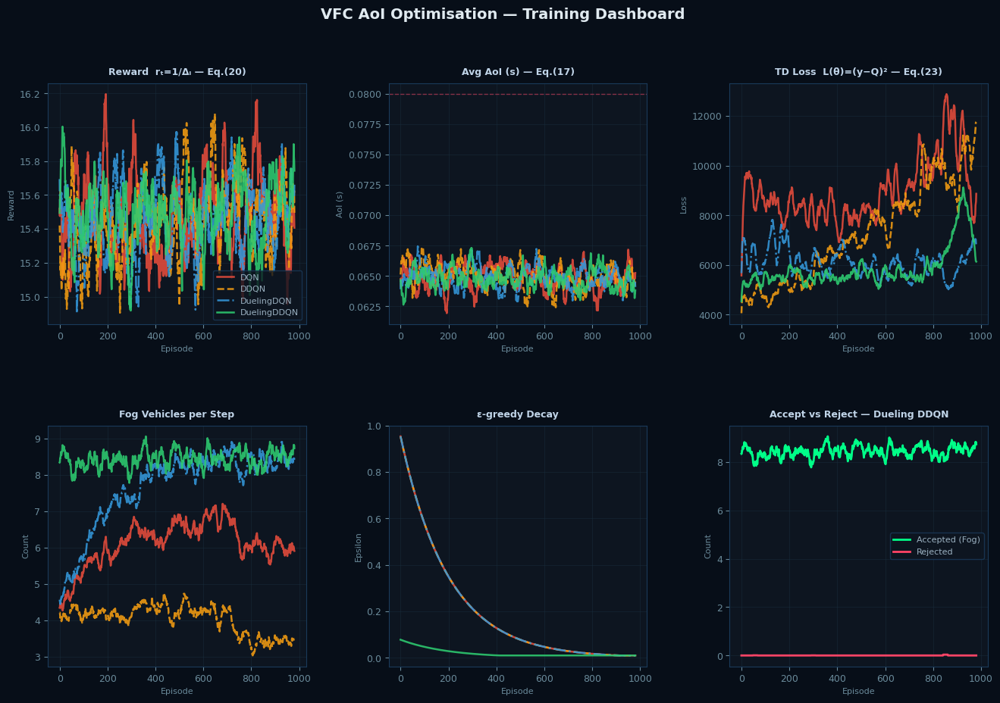

✅ dashboard.png saved!


In [22]:
fig = plt.figure(figsize=(16, 10))
fig.patch.set_facecolor('#070e18')
gs  = gridspec.GridSpec(2, 3, hspace=0.42, wspace=0.32)

PANELS = [
    ('Reward  rₜ=1/Δᵢ — Eq.(20)',      'R', 'Reward',  None),
    ('Avg AoI (s) — Eq.(17)',           'A', 'AoI (s)', AOI_TH),
    ('TD Loss  L(θ)=(y−Q)² — Eq.(23)', 'L', 'Loss',    None),
    ('Fog Vehicles per Step',           'F', 'Count',   None),
    ('ε-greedy Decay',                  'E', 'Epsilon', None),
    ('Accept vs Reject',                None, 'Count',  None),
]

for idx, (title, key, yl, hline) in enumerate(PANELS):
    ax = fig.add_subplot(gs[idx // 3, idx % 3])
    ax.set_facecolor('#0d1520')
    ax.grid(True, color='#1a3040', lw=0.5, alpha=0.6)
    ax.tick_params(colors='#6a8a9a', labelsize=9)
    for sp in ax.spines.values(): sp.set_edgecolor('#1a3a5a')
    ax.set_title(title, color='#c0d4e8', fontsize=9, fontweight='bold', pad=8)
    ax.set_xlabel('Episode', color='#6a8a9a', fontsize=8)
    ax.set_ylabel(yl, color='#6a8a9a', fontsize=8)

    if idx < 5:  # panels 0-4: single series per algo
        for algo, res in results.items():
            s = STYLES[algo]
            d = smooth(res[key])
            ax.plot(np.arange(len(d)), d,
                    color=s['c'], ls=s['ls'], lw=1.8, label=algo, alpha=0.88)
        if hline:
            ax.axhline(hline, color='#ff4466', lw=1, ls='--', alpha=0.5)
        if idx == 0:
            ax.legend(facecolor='#0d1520', edgecolor='#1a3a5a',
                      labelcolor='#9ab0c0', fontsize=8, loc='lower right')

    else:  # panel 5: Accept vs Reject for Dueling DDQN only
        res = results['DuelingDDQN']
        fog_s = smooth(res['F'])
        # Approximate rejected = vehicles in range - fog
        rej_s = smooth([max(0, NUM_VEH * 0.5 - f) for f in res['F']])
        x = np.arange(len(fog_s))
        ax.plot(x, fog_s, color='#00ff88', lw=2, label='Accepted (Fog)')
        ax.plot(x, rej_s, color='#ff4466', lw=2, label='Rejected')
        ax.legend(facecolor='#0d1520', edgecolor='#1a3a5a',
                  labelcolor='#9ab0c0', fontsize=8)
        ax.set_title('Accept vs Reject — Dueling DDQN',
                     color='#c0d4e8', fontsize=9, fontweight='bold', pad=8)

fig.suptitle('VFC AoI Optimisation — Training Dashboard',
             color='#e0eaf0', fontsize=14, fontweight='bold', y=0.98)
plt.savefig('dashboard.png', dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()
print('✅ dashboard.png saved!')

---
## Step 12 — Inspect CSV Training Log

In [23]:
df = pd.read_csv(LOG_PATH)
print(f'Total episodes logged  : {len(df)}')
print(f'Training time          : {df["timestamp_s"].max():.0f}s')
print(f'Final epsilon          : {df["epsilon"].iloc[-1]:.4f}')
print(f'Best avg reward        : {df["avg_reward"].max():.4f}  '
      f'(ep {df["avg_reward"].idxmax() + 1})')
print(f'Lowest avg AoI         : {df["avg_aoi"].min():.6f}s  '
      f'(ep {df["avg_aoi"].idxmin() + 1})')
print(f'Peak fog count         : {df["fog_count"].max():.2f}')
print()
print('Last 10 episodes:')
print(df.tail(10).to_string(index=False))

Total episodes logged  : 1500
Training time          : 1130s
Final epsilon          : 0.0100
Best avg reward        : 18.0919  (ep 1394)
Lowest avg AoI         : 0.055280s  (ep 1394)
Peak fog count         : 10.00

Last 10 episodes:
 episode  total_steps  epsilon  avg_reward  avg_aoi    avg_loss  fog_count  rejected_count  buffer_size  timestamp_s
     991       298074     0.01     16.9758 0.058909 5278.059248      10.00            0.00        10000       1120.1
     992       298274     0.01     14.3896 0.069497 5321.544583       7.95            2.06        10000       1121.3
     993       298474     0.01     14.9882 0.066719 6584.825867       8.91            1.09        10000       1122.4
     994       298674     0.01     17.7919 0.056205 5346.634648       9.94            0.06        10000       1123.5
     995       298874     0.01     16.9235 0.059093 6311.406246       9.95            0.06        10000       1124.6
     996       299074     0.01     17.0280 0.058733 4637.186526  

---
## Step 13 — Final Summary

In [24]:
print('=' * 60)
print('  FINAL RESULTS — Last 100 Episodes')
print('=' * 60)
print(f"  {'Algorithm':14s}|{'Reward':9s}|{'AoI':11s}|{'Fog':7s}")
print(f"  {'-'*46}")
for algo in ALGOS:
    r   = results[algo]
    tag = ' ← BEST ✅' if algo == 'DuelingDDQN' else ''
    print(f"  {algo:14s}|{np.mean(r['R'][-100:]):9.4f}|"
          f"{np.mean(r['A'][-100:]):11.4f}s|"
          f"{np.mean(r['F'][-100:]):7.2f}{tag}")

print(f'\n  Vehicles: {NUM_VEH} | RSUs: {NUM_RSU} | '
      f'Episodes: {EPISODES} | Device: {DEVICE}')

print('\n  Files produced:')
for f in [
    CKPT_PATH, BEST_PATH, WEIGHTS_PATH, LOG_PATH,
    'figure4_reward_convergence.png',
    'figure5_aoi_vs_vehicles.png',
    'dashboard.png',
]:
    status = '✅' if os.path.exists(f) else '❌'
    print(f'  {status} {f}')

print('\n✅ Notebook complete!')

  FINAL RESULTS — Last 100 Episodes
  Algorithm     |Reward   |AoI        |Fog    
  ----------------------------------------------
  DQN           |  15.4390|     0.0651s|   6.02
  DDQN          |  15.5371|     0.0646s|   3.47
  DuelingDQN    |  15.4829|     0.0648s|   8.39
  DuelingDDQN   |  15.6177|     0.0643s|   8.58 ← BEST ✅

  Vehicles: 10 | RSUs: 3 | Episodes: 1000 | Device: cpu

  Files produced:
  ✅ saved_models/dueling_ddqn_checkpoint.pth
  ✅ saved_models/dueling_ddqn_best.pth
  ✅ saved_models/dueling_ddqn_online.pth
  ✅ training_log.csv
  ✅ figure4_reward_convergence.png
  ✅ figure5_aoi_vs_vehicles.png
  ✅ dashboard.png

✅ Notebook complete!
